<a href="https://colab.research.google.com/github/AbrahamKong/A5-1-in-Python/blob/master/CMPE_255_Assignment_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Upload Data File**

In [2]:
#download hotel_bookings.csv downloaded from kaggle.com
#upload hotel_bookings.csv file here
# data file from https://www.kaggle.com/jessemostipak/hotel-booking-demand
from google.colab import files
files.upload()

Saving hotel_bookings.csv to hotel_bookings.csv


{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date\nResort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NULL,NULL,0,Transient,75,0,0,Check-Out,2015-07-02\nResort Hotel,0,13,2015,July,27,1,0,1,1,

**Setting up environment**

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib
from matplotlib import pyplot as plt


% matplotlib inline


**Read in Data**

In [89]:
#read hotel.bookings.csv
df1 = pd.read_csv("/content/hotel_bookings.csv")
df1.shape

(119390, 32)

In [90]:
sum(df1.duplicated())

31994

In [91]:
df = df1.copy()

In [92]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [94]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [95]:
# count all the counrties
counts = df['country'].value_counts()
counts


PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
       ...  
ASM        1
NCL        1
KIR        1
GUY        1
BHS        1
Name: country, Length: 177, dtype: int64

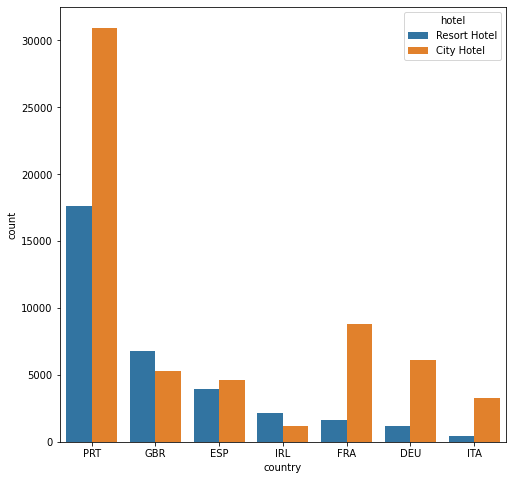

In [96]:
plt.subplots(figsize  = (8, 8))
sns.countplot(x = "country", hue = "hotel", data = df[df['country'].isin(counts[counts > 3000].index)])
plt.show()

**Clean up data**

In [97]:
drop_col = ['arrival_date_year', 'arrival_date_week_number', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes',
               'agent', 'days_in_waiting_list', 'required_car_parking_spaces', 'country', 'company','market_segment','distribution_channel','deposit_type','customer_type','reservation_status']


df.drop(drop_col, axis = 1, inplace = True)

In [98]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,is_repeated_guest,reserved_room_type,assigned_room_type,adr,total_of_special_requests,reservation_status_date
0,Resort Hotel,0,342,July,1,0,0,2,0.0,0,BB,0,C,C,0.0,0,2015-07-01
1,Resort Hotel,0,737,July,1,0,0,2,0.0,0,BB,0,C,C,0.0,0,2015-07-01
2,Resort Hotel,0,7,July,1,0,1,1,0.0,0,BB,0,A,C,75.0,0,2015-07-02
3,Resort Hotel,0,13,July,1,0,1,1,0.0,0,BB,0,A,A,75.0,0,2015-07-02
4,Resort Hotel,0,14,July,1,0,2,2,0.0,0,BB,0,A,A,98.0,1,2015-07-03


In [99]:
# check for null data
df.isnull().sum()

hotel                        0
is_canceled                  0
lead_time                    0
arrival_date_month           0
arrival_date_day_of_month    0
stays_in_weekend_nights      0
stays_in_week_nights         0
adults                       0
children                     4
babies                       0
meal                         0
is_repeated_guest            0
reserved_room_type           0
assigned_room_type           0
adr                          0
total_of_special_requests    0
reservation_status_date      0
dtype: int64

In [100]:
# No null data, so skip step of making default for null data

In [101]:
df.shape

(119390, 17)

**Featuring**

In [102]:
# Find feature in each column

x = df.select_dtypes(object).columns

for i in x:
  print(i, df[i].nunique())

hotel 2
arrival_date_month 12
meal 5
reserved_room_type 10
assigned_room_type 12
reservation_status_date 926


**Label Encoding**

In [103]:
# Decide not to use One-Hot Encoding for this exercise
# since the order of the data is not significantly important
# plus, some of the category has way too many features like company name and reservation_status_date
# thus, I am choosing to use Label Encoder for this exercise

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [104]:
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

In [105]:
df['year'] = df['reservation_status_date'].dt.year
df['month'] = df['reservation_status_date'].dt.month
df['day'] = df['reservation_status_date'].dt.day

In [106]:
#remove unnecessary column
df.drop(['reservation_status_date'], axis=1, inplace=True)

In [107]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,is_repeated_guest,reserved_room_type,assigned_room_type,adr,total_of_special_requests,year,month,day
0,Resort Hotel,0,342,July,1,0,0,2,0.0,0,BB,0,C,C,0.0,0,2015,7,1
1,Resort Hotel,0,737,July,1,0,0,2,0.0,0,BB,0,C,C,0.0,0,2015,7,1
2,Resort Hotel,0,7,July,1,0,1,1,0.0,0,BB,0,A,C,75.0,0,2015,7,2
3,Resort Hotel,0,13,July,1,0,1,1,0.0,0,BB,0,A,A,75.0,0,2015,7,2
4,Resort Hotel,0,14,July,1,0,2,2,0.0,0,BB,0,A,A,98.0,1,2015,7,3


In [108]:
# appen featured data

x = df.select_dtypes(object).columns
featuredDataList = []

for i in x:
  print(i, df[i].nunique())
  featuredDataList.append(i)

hotel 2
arrival_date_month 12
meal 5
reserved_room_type 10
assigned_room_type 12


In [128]:
df = df.apply(LabelEncoder().fit_transform)

In [130]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,is_repeated_guest,reserved_room_type,assigned_room_type,adr,total_of_special_requests,year,month,day
0,1,0,342,5,0,0,0,2,0,0,0,0,2,2,1,0,1,6,0
1,1,0,478,5,0,0,0,2,0,0,0,0,2,2,1,0,1,6,0
2,1,0,7,5,0,0,1,1,0,0,0,0,0,2,2136,0,1,6,1
3,1,0,13,5,0,0,1,1,0,0,0,0,0,0,2136,0,1,6,1
4,1,0,14,5,0,0,2,2,0,0,0,0,0,0,3535,1,1,6,2


**Check Duplicate and Remove**

In [121]:
sum(df.duplicated())

0

In [122]:
df.drop_duplicates(inplace=True)

In [123]:
df.shape

(84125, 19)

**train_test_split based on Cancellation rate**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



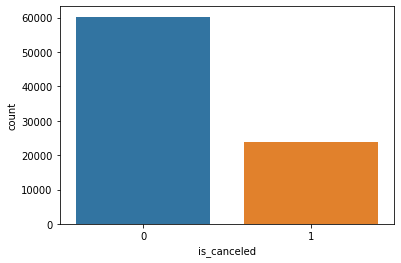

In [124]:
sns.countplot(df['is_canceled'])

In [125]:
from sklearn.model_selection import train_test_split

y = df['is_canceled']
x = df.drop('is_canceled', axis = 1)

x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = 100)
x_train

,hotel,lead_time,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,is_repeated_guest,reserved_room_type,assigned_room_type,adr,total_of_special_requests,year,month,day
11744,1,103,8,27,2,2,2,0,0,0,0,0,0,603,1,3,1,13
110454,0,80,0,23,1,3,2,0,0,3,0,0,0,4000,1,3,3,27
29700,1,292,9,2,0,1,2,0,0,0,0,0,0,329,1,2,10,3
97718,0,19,11,17,2,0,2,0,0,0,0,0,0,3363,0,2,8,19
81082,0,11,9,29,1,2,1,0,0,0,0,0,3,1014,0,1,11,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96193,0,198,1,24,2,3,2,0,0,0,0,0,0,1959,0,2,7,29
111334,0,0,8,6,2,0,2,0,0,3,0,0,0,5270,0,3,4,8
113915,0,51,6,8,2,3,2,0,0,0,0,3,3,2327,5,3,5,13
84200,0,15,3,17,0,3,2,0,0,0,0,0,0,3185,0,2,1,20


**Feature Scaling**

In [127]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

**Train Model**

In [133]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0)

clf.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

In [134]:
y_predict = clf.predict(x_test)

**Evaluate Model**

In [135]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

acc_sc = accuracy_score(y_test, y_predict)
acc_sc

0.36130658044883984

In [137]:
conf = confusion_matrix(y_test, y_predict)
conf

array([[ 2647, 12329],
       [ 1104,  4952]])

In [138]:
clf_re = classification_report(y_test, y_predict)
clf_re

'              precision    recall  f1-score   support\n\n           0       0.71      0.18      0.28     14976\n           1       0.29      0.82      0.42      6056\n\n    accuracy                           0.36     21032\n   macro avg       0.50      0.50      0.35     21032\nweighted avg       0.58      0.36      0.32     21032\n'